# Flower Image Synthesis Using Deep Convolutional Generative Adversial Networks

languages:
- Python (tensorflow, keras)

article: https://arxiv.org/pdf/1511.06434.pdf

Dataset: https://www.tensorflow.org/datasets/catalog/tf_flowers ⇒ you can visit dataset on [Know your Data Website](https://knowyourdata-tfds.withgoogle.com//#tab=STATS&dataset=tf_flowers)

# Configuration

In [1]:
import sys

assert sys.version_info >= (3, 7)

In [2]:
from packaging import version
import tensorflow as tf

assert version.parse(tf.__version__) >= version.parse("2.8.0")

In [3]:
import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

In [4]:
from pathlib import Path

IMAGES_PATH = Path() / "images" / "deep"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

In [5]:
# Is this notebook running on Colab or Kaggle?
IS_COLAB = "google.colab" in sys.modules
IS_KAGGLE = "kaggle_secrets" in sys.modules

if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. Neural nets can be very slow without a GPU.")
    if IS_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware "
              "accelerator.")
    if IS_KAGGLE:
        print("Go to Settings > Accelerator and select GPU.")

In [6]:
IMAGE_SIZE = 64
EPOCHS = 500
NOISE_SIZE = 100
NUM_NEW_IMAGES = 4000
DATASET_FOLDER = 'flower_photos/'
LOG_PARAM_FOLDER = 'logs/hparam_tuning/'

BATCH_SIZE = 64
LR_D = 0.0002  # According to the DCGAN Paper
LR_G = 0.0002  # According to the DCGAN Paper

BETA1 = 0.9 
EPSILON = 0.9
LEAK_RELU_APLPHA = 0.2  # According to the DCGAN Paper

KERNEL_INITIALIZER='glorot_uniform' 

# Imports

In [9]:
from datetime import datetime
import os
from glob import glob
from IPython import display
import imageio
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import PIL
from PIL import Image
import pytz
import random
from scipy import ndarray
import skimage as sk
from skimage import io
from skimage import util
from skimage import transform
import tensorflow as tf
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import time
from tensorboard.plugins.hparams import api as hp
from tqdm import tqdm 

In [10]:
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

# Models

Both the generator and discriminator are defined using the Keras Sequential API.

## Defining hyperparameters for tuining

In [14]:
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.0, 0.2))
HP_EPSILON = hp.HParam('epsilon', hp.RealInterval(0.001, 0.9))
# HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam']))
HP_LR_D = hp.HParam('lr_d', hp.RealInterval(LR_D-1e-4, LR_D+1e-4))
HP_LR_G = hp.HParam('lr_g', hp.RealInterval(LR_G-1e-4, LR_G+1e-4))

METRIC_D_LOSS = 'd_loss'
METRIC_G_LOSS = 'g_loss'

with tf.summary.create_file_writer(LOG_PARAM_FOLDER).as_default():
  hp.hparams_config(
      hparams=[HP_DROPOUT, HP_EPSILON, HP_LR_D, HP_LR_G],
      metrics=[hp.Metric(METRIC_D_LOSS, display_name='D_Loss'), hp.Metric(METRIC_G_LOSS, display_name='G_Loss')]
  )

## Generator

In [15]:
def make_generator_model(hparams):
  model = tf.keras.Sequential()
  model.add(layers.Dense(4*4*64, use_bias=False, input_shape=(NOISE_SIZE,)))
  model.add(layers.BatchNormalization(epsilon=hparams[HP_EPSILON]))
  model.add(layers.LeakyReLU(alpha=LEAK_RELU_APLPHA))

  model.add(layers.Reshape((4, 4, 64)))
  assert model.output_shape == (None, 4, 4, 64)

  model.add(layers.Conv2DTranspose(256, (5, 5), strides=(2, 2),
                                   padding='same', use_bias=False,
                                   kernel_initializer=KERNEL_INITIALIZER))
  assert model.output_shape == (None, 8, 8, 256)
  model.add(layers.BatchNormalization(epsilon=hparams[HP_EPSILON]))
  model.add(layers.LeakyReLU(alpha=LEAK_RELU_APLPHA))

  model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2),
                                   padding='same', use_bias=False,
                                   kernel_initializer=KERNEL_INITIALIZER))
  assert model.output_shape == (None, 16, 16, 128)
  model.add(layers.BatchNormalization(epsilon=hparams[HP_EPSILON]))
  model.add(layers.LeakyReLU(alpha=LEAK_RELU_APLPHA))

  model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2),
                                   padding='same', use_bias=False,
                                   kernel_initializer=KERNEL_INITIALIZER))
  assert model.output_shape == (None, 32, 32, 64)
  model.add(layers.BatchNormalization(epsilon=hparams[HP_EPSILON]))
  model.add(layers.LeakyReLU(alpha=LEAK_RELU_APLPHA))

  model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2),
                                   padding='same', use_bias=False, 
                                   activation='tanh',
                                   kernel_initializer=KERNEL_INITIALIZER))
  assert model.output_shape == (None, 64, 64, 3)

  return model

Initializing Generator Model

In [ ]:
# generator = make_generator_model()
# generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              102400    
                                                                 
 batch_normalization (BatchN  (None, 1024)             4096      
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 1024)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 64)          0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 256)        409600    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 256)        1

Using the (as yet) untrained generator to create an image.

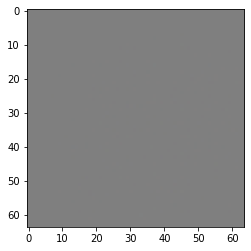

In [ ]:
# noise = tf.random.normal([1, NOISE_SIZE])
# generated_image = generator(noise, training=False)

# generated_image2 = generated_image[0].numpy() * 127.5 + 127.5

# plt.imshow(generated_image2.astype('uint8'))

## Discriminator

In [16]:
def make_discriminator_model(hparams):
  model = tf.keras.Sequential()
  model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                          input_shape=[64, 64, 3],
                          kernel_initializer=KERNEL_INITIALIZER))
  model.add(layers.BatchNormalization(epsilon=hparams[HP_EPSILON]))
  model.add(layers.LeakyReLU(alpha=LEAK_RELU_APLPHA))
  # model.add(layers.Dropout(hparams[HP_DROPOUT]))
  model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same',
                          input_shape=[64, 64, 3],
                          kernel_initializer=KERNEL_INITIALIZER))
  model.add(layers.BatchNormalization(epsilon=hparams[HP_EPSILON]))
  model.add(layers.LeakyReLU(alpha=LEAK_RELU_APLPHA))
  # model.add(layers.Dropout(hparams[HP_DROPOUT]))

  model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same',
                          input_shape=[64, 64, 3],
                          kernel_initializer=KERNEL_INITIALIZER))
  model.add(layers.BatchNormalization(epsilon=hparams[HP_EPSILON]))
  model.add(layers.LeakyReLU(alpha=LEAK_RELU_APLPHA))
  # model.add(layers.Dropout(hparams[HP_DROPOUT]))

  model.add(layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same',
                          input_shape=[64, 64, 3],
                          kernel_initializer=KERNEL_INITIALIZER))
  model.add(layers.BatchNormalization(epsilon=hparams[HP_EPSILON]))
  model.add(layers.LeakyReLU(alpha=LEAK_RELU_APLPHA))
  # model.add(layers.Dropout(hparams[HP_DROPOUT]))

  model.add(layers.Flatten())
  model.add(layers.Dense(1))

  return model

In [ ]:
# discriminator = make_discriminator_model()
# discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 64)        4864      
                                                                 
 batch_normalization_4 (Batc  (None, 32, 32, 64)       256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       204928    
                                                                 
 batch_normalization_5 (Batc  (None, 16, 16, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16, 16, 128)      

Use the (as yet) untrained discriminator to classify the generated images as real or fake. 
The model will be trained to output positive values for real images, and negative values for fake images.

In [ ]:
# decision = discriminator(generated_image)
# print (decision)

tf.Tensor([[-1.6568112e-05]], shape=(1, 1), dtype=float32)


# Data Preparation

## Fetch Dataset

In [ ]:
import pathlib
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
archive = tf.keras.utils.get_file(origin=dataset_url, extract=True)
data_dir = pathlib.Path(archive).with_suffix('')

228813984/228813984 [==============================] - 10s 0us/step


In [ ]:
import sys, tarfile

def extract(tar_url, extract_path='.'):
    print(tar_url)
    tar = tarfile.open(tar_url, 'r')
    for item in tar:
        tar.extract(item, extract_path)
        if item.name.find(".tgz") != -1 or item.name.find(".tar") != -1:
            extract(item.name, "./" + item.name[:item.name.rfind('/')])

In [ ]:
DATASET_EXIST = False
if ~DATASET_EXIST:
  print('Fetching the Image Dataset')
  !wget https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz
  print('Unzipping the file')
  ZIP_FILE = './flower_photos.tgz'
  !rm -rf /content/flower_photos/
  extract(ZIP_FILE)
  print('Flower Images are available')

Fetching the Image Dataset
--2023-02-16 23:05:35--  https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz
Resolving storage.googleapis.com (storage.googleapis.com)... 172.217.194.128, 74.125.200.128, 74.125.68.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.217.194.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 228813984 (218M) [application/x-compressed-tar]
Saving to: ‘flower_photos.tgz’

flower_photos.tgz   100%[===================>] 218.21M  23.6MB/s    in 11s     

2023-02-16 23:05:46 (20.7 MB/s) - ‘flower_photos.tgz’ saved [228813984/228813984]

Unzipping the file
./flower_photos.tgz
Flower Images are available


Now, we store all images' name in one place. (In generating new flower images we don't need labels (just on label: is it generated or original).

In [ ]:
images = [os.path.join(x, image_name) for x, y, z in os.walk(DATASET_FOLDER) for image_name in z if image_name.endswith(('.jpg', '.png', '.jpeg'))]

In [ ]:
len(images)

3670

In [ ]:
# !rm -rf ./flower_photos

## Image Plot Functions

In [26]:
def show_samples(sample_images):
  print(f'len(sample_images): {len(sample_images)}')
  print(f'len(sample_images): {sample_images[0].shape}')

  figure, axes = plt.subplots(1, len(sample_images), figsize=(50, 50))

  print('figure: ', figure)
  print('axes: ', axes)

  for index, axis in enumerate(axes):
    axis.axis('off')
    image_array = sample_images[index]
    axis.imshow(image_array)
  
  plt.show()
  plt.close()

In [25]:
def show_samples_(sample_images):
  figure, axes = plt.subplots(1, len(sample_images), figsize=(50, 50))

  for index, axis in enumerate(axes):
    axis.axis('off')
    image_array = sample_images[index]
    image_array = image_array.numpy() * 127.5 + 127.5
    axis.imshow(image_array.astype(np.uint8))
  
  plt.show()
  plt.close()

In [ ]:
def show_image(input_image):
  fit = plt.figure(figsize=(4, 4))
  plt.imshow(input_image)
  plt.axis('off')
  plt.show()

In [ ]:
def summarize_epoch(epoch, d_losses, g_losses, save_image=True):
  fig, ax = plt.subplots()
  plt.plot(d_losses, label='Discriminator', alpha=0.6)
  plt.plot(g_losses, label='Generator', alpha=0.6)
  plt.title('Losses')
  plt.legend()
  if save_image:
    plt.savefig('losses_' + str(epoch) + '.png')
  
  plt.show()
  plt.close()

In [27]:
def generate_images(model, epoch, test_input, save_images=True):
  predictions = model(test_input, training=True)

  fig = plt.figure(figsize=(4, 4))
  for index in range(predictions.shape[0]):
    plt.subplot(4, 4, index+1)
    generated_image = predictions[index].numpy() * 127.5 + 127.5
    plt.imshow(generated_image.astype('uint8'))
    plt.axis('off')
  
  if save_images:
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  
  plt.show()

## Data Augmentation

Using random rotation, horizontal flips, vertical flips, cropping padded images(no channel cropping)

In [ ]:
def random_rotate(image_array):
  random_degree = random.uniform(-20, 20)
  return sk.transform.rotate(image_array, random_degree)

def horizontal_flip(image_array):
  return image_array[:, ::-1]

def vertical_flip(image_array):
  return image_array[::-1, :]

def vertical_horizontal_flip(image_array):
  v_flipped_image = vertical_flip(image_array)
  return horizontal_flip(v_flipped_image)

def crop_pad(X, n_pixels=20, pad_mode='edge'):
  '''pad image by n pixels on each size (w, h),
   and then take random crop of same original size.'''
  assert len(X.shape) == 3
  h, w, c = X.shape

  padded = sk.util.pad(X, [(n_pixels, n_pixels) for _ in range(2)] + [(0, 0)],
                       mode=pad_mode)
  crops = [(_c, 2 * n_pixels - _c) for _c in np.random.randint(0, 2 * n_pixels+1, [2])]
  crops += [(0, 0)]
  return sk.transform.resize(sk.util.crop(padded, crops, copy=True), (IMAGE_SIZE, IMAGE_SIZE))

In [ ]:
AUGMENTED_DIR = os.path.join(DATASET_FOLDER, 'augmented')
os.mkdir(AUGMENTED_DIR)

In [ ]:
transformations = {
    'rotate': random_rotate,
    'vertical_flip': vertical_flip,
    'horizontal_flip': horizontal_flip,
    'vertical_horizontal_flip': vertical_horizontal_flip,
    'crop_pad': crop_pad
}

num_generated_images = 0
while num_generated_images <= NUM_NEW_IMAGES:
  image_path = random.choice(images)
  image_to_transform = sk.io.imread(image_path)
  num_transformation_to_apply = random.randint(1, len(transformations))

  transformed_image = None
  for num_of_transformation in range(num_transformation_to_apply):
    key = random.choice(list(transformations))
    transformed_image = transformations[key](image_to_transform)

    new_image_path = '{}/augmented_image_{}.jpg'.format(AUGMENTED_DIR, num_generated_images)

    io.imsave(new_image_path, transformed_image)
    num_generated_images += 1

<ipython-input-24-8387f0c89a82>:21: FutureWarning: skimage.util.pad is deprecated and will be removed in version 0.19. Please use numpy.pad instead.
  padded = sk.util.pad(X, [(n_pixels, n_pixels) for _ in range(2)] + [(0, 0)],


Add new images to the original ones.

In [ ]:
images = images + [os.path.join(AUGMENTED_DIR, augmented_data) for augmented_data in os.listdir(AUGMENTED_DIR)]

## Load and prepare the dataset

In [ ]:
input_images = np.asarray([np.asarray(
    Image.open(file)
    .resize((IMAGE_SIZE, IMAGE_SIZE))
) for file in images])

print("Input: " + str(input_images.shape))

np.random.shuffle(input_images)

train_images = input_images.reshape(input_images.shape[0], 64, 64, 3).astype('float32')
train_images = (train_images - 127.5) / 127.5 # tf.keras.layers.Rescaling

BUFFER_SIZE = input_images.shape[0]

train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

Input: (7671, 64, 64, 3)


len(sample_images): 5
len(sample_images): (64, 64, 3)
figure:  Figure(3600x3600)
axes:  [<matplotlib.axes._subplots.AxesSubplot object at 0x7fefa8363730>


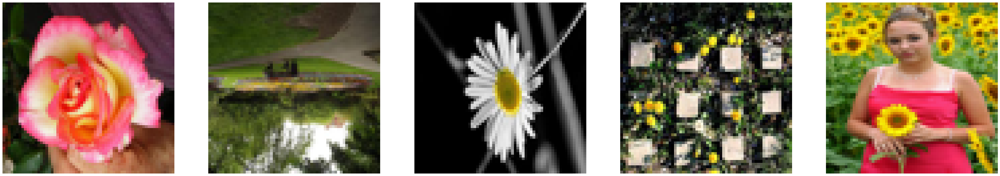

In [ ]:
sample_images = input_images[:5]
show_samples(sample_images)

Present one Image and Its Transformations via defined transformations

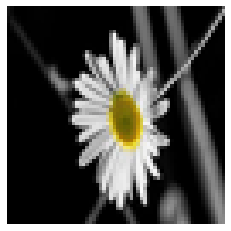

In [ ]:
show_image(input_images[2])

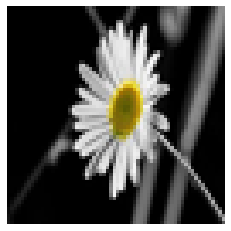

In [ ]:
show_image(vertical_flip(input_images[2]))

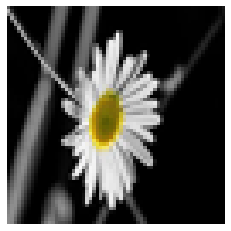

In [ ]:
show_image(horizontal_flip(input_images[2]))

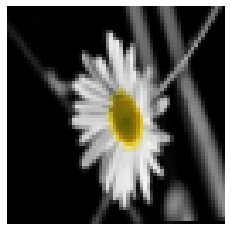

In [ ]:
show_image(random_rotate(input_images[2]))

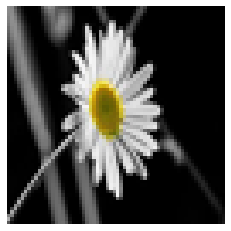

In [ ]:
show_image(vertical_horizontal_flip(input_images[2]))

# Train and Test Models

## Creating Models with hyperparameters

In [17]:
def create_models(hparams):
  generator = make_generator_model(hparams)
  discriminator = make_discriminator_model(hparams)

  return generator, discriminator

## Loss and optimizers

With below cell, we create a helper to compute cross entropy loss

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator Loss

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [18]:
def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)

  total_loss = real_loss + fake_loss
  return total_loss

### Generator Loss

The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, we will compare the discriminators decisions on the generated images to an array of 1s.

In [19]:
def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

The discriminator and the generator optimizers are different since we will train two networks separately.

In [ ]:
# generator_optimizer     = tf.keras.optimizers.Adam(learning_rate=LR_G, beta_1=BETA1)
# discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=LR_D, beta_1=BETA1)

# generator_optimizer = tf.keras.optimizers.RMSprop(learning_rate=LR_G)
# discriminator_optimizer = tf.keras.optimizers.RMSprop(learning_rate=LR_D)

## Training models with different hyperparameters

Creating Noise Sample to feed model. In order to visualize progress in animated Gif, we define a seed.

In [ ]:
noise_dim = NOISE_SIZE
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

The training loop begins with feeding the generator with a random noise as an input. That noise is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fake images (made by the generator). The loss is calculated for each these models, and the gradients are used to update the generator and discriminator.

### Adapt TensorFlow runs to log hyperparameters and metrics

In [20]:
# Using tf.function to annotate as a tensorflow function
# tf.function analyzed the computation performed by train_step() function and
# generate an equivalent computation graph!

@tf.function
def train_step(images):
  noise = tf.random.normal([BATCH_SIZE, noise_dim])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)
  
  gradients_of_generator = gen_tape.gradient(gen_loss,
                                             generator.trainable_variables)
  gradients_of_discriminator = disc_tape.gradient(disc_loss,
                                                  discriminator.trainable_variables)
  
  generator_optimizer.apply_gradients(zip(gradients_of_generator, 
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, 
                                              discriminator.trainable_variables))
  
  return gen_loss, disc_loss

In [ ]:
def train_models(dataset, epochs, hparams):
  num_d_loss = 0
  num_g_loss = 0
  d_average = 0
  g_average = 0

  for epoch in tqdm(range(epochs)):
    # print(f'{epoch}/{epochs}:', end='\r')
    for image_batch in dataset:
      d_loss, g_loss = train_step(image_batch)
      d_average += d_loss
      g_average += g_loss
      num_d_loss += 1
      num_g_loss += 1
    
  print(d_average, g_average)
  return d_average / num_d_loss, g_average / num_g_loss

In [ ]:
def run(run_dir, hparams, dataset, epochs):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)
    d_losses, g_losses = train_models(dataset, epochs, hparams)
    tf.summary.scalar(METRIC_G_LOSS, g_losses, step=1)
    tf.summary.scalar(METRIC_D_LOSS, d_losses, step=1)

### Start runs and log them all under one parent directory

In [ ]:
session_num = 0

for _ in range(2):
  dropout_rate = HP_DROPOUT.domain.sample_uniform()
  for epsilon in (HP_EPSILON.domain.min_value, HP_EPSILON.domain.max_value):
    for lr_g in np.linspace(HP_LR_G.domain.min_value, HP_LR_G.domain.max_value,3,):
      for lr_d in np.linspace(HP_LR_D.domain.min_value, HP_LR_D.domain.max_value,3,):
        hparams = {
                  HP_EPSILON: epsilon,
                  HP_DROPOUT: dropout_rate,
                  HP_LR_G: lr_g,
                  HP_LR_D: lr_d,
              }
        generator, discriminator = create_models(hparams)
        generator_optimizer     = tf.keras.optimizers.Adam(
            learning_rate=hparams[HP_LR_G], beta_1=BETA1)
        discriminator_optimizer = tf.keras.optimizers.Adam(
            learning_rate=hparams[HP_LR_D], beta_1=BETA1)

        run_name = "run_%d" % session_num
        print('---- Starting trial: %s' % run_name)
        print({h.name: hparams[h] for h in hparams})
        run(LOG_PARAM_FOLDER + run_name, hparams, train_dataset, 100)
        session_num += 1

---- Starting trial: run_0
{'epsilon': 0.001, 'dropout': 0.11842255100119375, 'lr_g': 0.0001, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:48<00:00,  2.28s/it]


tf.Tensor(101874.63, shape=(), dtype=float32) tf.Tensor(1257.3275, shape=(), dtype=float32)
---- Starting trial: run_1
{'epsilon': 0.001, 'dropout': 0.11842255100119375, 'lr_g': 0.0001, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:28<00:00,  2.08s/it]


tf.Tensor(109356.41, shape=(), dtype=float32) tf.Tensor(1192.4193, shape=(), dtype=float32)
---- Starting trial: run_2
{'epsilon': 0.001, 'dropout': 0.11842255100119375, 'lr_g': 0.0001, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(105171.34, shape=(), dtype=float32) tf.Tensor(1380.5308, shape=(), dtype=float32)
---- Starting trial: run_3
{'epsilon': 0.001, 'dropout': 0.11842255100119375, 'lr_g': 0.00020000000000000004, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(109434.3, shape=(), dtype=float32) tf.Tensor(1172.6516, shape=(), dtype=float32)
---- Starting trial: run_4
{'epsilon': 0.001, 'dropout': 0.11842255100119375, 'lr_g': 0.00020000000000000004, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(118411.21, shape=(), dtype=float32) tf.Tensor(973.48816, shape=(), dtype=float32)
---- Starting trial: run_5
{'epsilon': 0.001, 'dropout': 0.11842255100119375, 'lr_g': 0.00020000000000000004, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(123073.64, shape=(), dtype=float32) tf.Tensor(928.12616, shape=(), dtype=float32)
---- Starting trial: run_6
{'epsilon': 0.001, 'dropout': 0.11842255100119375, 'lr_g': 0.00030000000000000003, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:28<00:00,  2.08s/it]


tf.Tensor(131930.16, shape=(), dtype=float32) tf.Tensor(705.61993, shape=(), dtype=float32)
---- Starting trial: run_7
{'epsilon': 0.001, 'dropout': 0.11842255100119375, 'lr_g': 0.00030000000000000003, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(134540.97, shape=(), dtype=float32) tf.Tensor(831.0701, shape=(), dtype=float32)
---- Starting trial: run_8
{'epsilon': 0.001, 'dropout': 0.11842255100119375, 'lr_g': 0.00030000000000000003, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(142737.52, shape=(), dtype=float32) tf.Tensor(623.74725, shape=(), dtype=float32)
---- Starting trial: run_9
{'epsilon': 0.9, 'dropout': 0.11842255100119375, 'lr_g': 0.0001, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(147930.19, shape=(), dtype=float32) tf.Tensor(639.88116, shape=(), dtype=float32)
---- Starting trial: run_10
{'epsilon': 0.9, 'dropout': 0.11842255100119375, 'lr_g': 0.0001, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(153347.14, shape=(), dtype=float32) tf.Tensor(514.5399, shape=(), dtype=float32)
---- Starting trial: run_11
{'epsilon': 0.9, 'dropout': 0.11842255100119375, 'lr_g': 0.0001, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(156883.05, shape=(), dtype=float32) tf.Tensor(550.6817, shape=(), dtype=float32)
---- Starting trial: run_12
{'epsilon': 0.9, 'dropout': 0.11842255100119375, 'lr_g': 0.00020000000000000004, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(162320.9, shape=(), dtype=float32) tf.Tensor(512.4754, shape=(), dtype=float32)
---- Starting trial: run_13
{'epsilon': 0.9, 'dropout': 0.11842255100119375, 'lr_g': 0.00020000000000000004, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(178117.34, shape=(), dtype=float32) tf.Tensor(455.22855, shape=(), dtype=float32)
---- Starting trial: run_14
{'epsilon': 0.9, 'dropout': 0.11842255100119375, 'lr_g': 0.00020000000000000004, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(182898.12, shape=(), dtype=float32) tf.Tensor(413.71057, shape=(), dtype=float32)
---- Starting trial: run_15
{'epsilon': 0.9, 'dropout': 0.11842255100119375, 'lr_g': 0.00030000000000000003, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(178712.52, shape=(), dtype=float32) tf.Tensor(384.25677, shape=(), dtype=float32)
---- Starting trial: run_16
{'epsilon': 0.9, 'dropout': 0.11842255100119375, 'lr_g': 0.00030000000000000003, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(167637.94, shape=(), dtype=float32) tf.Tensor(476.81323, shape=(), dtype=float32)
---- Starting trial: run_17
{'epsilon': 0.9, 'dropout': 0.11842255100119375, 'lr_g': 0.00030000000000000003, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:28<00:00,  2.09s/it]


tf.Tensor(167356.45, shape=(), dtype=float32) tf.Tensor(499.4504, shape=(), dtype=float32)
---- Starting trial: run_18
{'epsilon': 0.001, 'dropout': 0.021267788920358056, 'lr_g': 0.0001, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(163822.66, shape=(), dtype=float32) tf.Tensor(582.7589, shape=(), dtype=float32)
---- Starting trial: run_19
{'epsilon': 0.001, 'dropout': 0.021267788920358056, 'lr_g': 0.0001, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(157154.11, shape=(), dtype=float32) tf.Tensor(635.5631, shape=(), dtype=float32)
---- Starting trial: run_20
{'epsilon': 0.001, 'dropout': 0.021267788920358056, 'lr_g': 0.0001, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(157033.4, shape=(), dtype=float32) tf.Tensor(515.99744, shape=(), dtype=float32)
---- Starting trial: run_21
{'epsilon': 0.001, 'dropout': 0.021267788920358056, 'lr_g': 0.00020000000000000004, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(156075.95, shape=(), dtype=float32) tf.Tensor(607.38403, shape=(), dtype=float32)
---- Starting trial: run_22
{'epsilon': 0.001, 'dropout': 0.021267788920358056, 'lr_g': 0.00020000000000000004, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(151558.22, shape=(), dtype=float32) tf.Tensor(581.13635, shape=(), dtype=float32)
---- Starting trial: run_23
{'epsilon': 0.001, 'dropout': 0.021267788920358056, 'lr_g': 0.00020000000000000004, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(157240.77, shape=(), dtype=float32) tf.Tensor(593.6596, shape=(), dtype=float32)
---- Starting trial: run_24
{'epsilon': 0.001, 'dropout': 0.021267788920358056, 'lr_g': 0.00030000000000000003, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(153007.56, shape=(), dtype=float32) tf.Tensor(573.11334, shape=(), dtype=float32)
---- Starting trial: run_25
{'epsilon': 0.001, 'dropout': 0.021267788920358056, 'lr_g': 0.00030000000000000003, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:30<00:00,  2.10s/it]


tf.Tensor(155150.53, shape=(), dtype=float32) tf.Tensor(548.601, shape=(), dtype=float32)
---- Starting trial: run_26
{'epsilon': 0.001, 'dropout': 0.021267788920358056, 'lr_g': 0.00030000000000000003, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(149707.12, shape=(), dtype=float32) tf.Tensor(598.528, shape=(), dtype=float32)
---- Starting trial: run_27
{'epsilon': 0.9, 'dropout': 0.021267788920358056, 'lr_g': 0.0001, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(149710.55, shape=(), dtype=float32) tf.Tensor(554.8324, shape=(), dtype=float32)
---- Starting trial: run_28
{'epsilon': 0.9, 'dropout': 0.021267788920358056, 'lr_g': 0.0001, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(150208.58, shape=(), dtype=float32) tf.Tensor(605.7706, shape=(), dtype=float32)
---- Starting trial: run_29
{'epsilon': 0.9, 'dropout': 0.021267788920358056, 'lr_g': 0.0001, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(153367.0, shape=(), dtype=float32) tf.Tensor(537.5531, shape=(), dtype=float32)
---- Starting trial: run_30
{'epsilon': 0.9, 'dropout': 0.021267788920358056, 'lr_g': 0.00020000000000000004, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(153051.48, shape=(), dtype=float32) tf.Tensor(556.498, shape=(), dtype=float32)
---- Starting trial: run_31
{'epsilon': 0.9, 'dropout': 0.021267788920358056, 'lr_g': 0.00020000000000000004, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(145896.36, shape=(), dtype=float32) tf.Tensor(606.0713, shape=(), dtype=float32)
---- Starting trial: run_32
{'epsilon': 0.9, 'dropout': 0.021267788920358056, 'lr_g': 0.00020000000000000004, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]


tf.Tensor(150255.5, shape=(), dtype=float32) tf.Tensor(538.5602, shape=(), dtype=float32)
---- Starting trial: run_33
{'epsilon': 0.9, 'dropout': 0.021267788920358056, 'lr_g': 0.00030000000000000003, 'lr_d': 0.0001}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(150984.38, shape=(), dtype=float32) tf.Tensor(540.9206, shape=(), dtype=float32)
---- Starting trial: run_34
{'epsilon': 0.9, 'dropout': 0.021267788920358056, 'lr_g': 0.00030000000000000003, 'lr_d': 0.00020000000000000004}


100%|██████████| 100/100 [03:29<00:00,  2.10s/it]


tf.Tensor(148982.36, shape=(), dtype=float32) tf.Tensor(516.2686, shape=(), dtype=float32)
---- Starting trial: run_35
{'epsilon': 0.9, 'dropout': 0.021267788920358056, 'lr_g': 0.00030000000000000003, 'lr_d': 0.00030000000000000003}


100%|██████████| 100/100 [03:29<00:00,  2.09s/it]

tf.Tensor(151730.11, shape=(), dtype=float32) tf.Tensor(624.55914, shape=(), dtype=float32)


### Visualize the results in TensorBoard's HParams plugin

In [ ]:
%tensorboard --logdir logs/hparam_tuning

<IPython.core.display.Javascript object>

From above results, we can deduce that using 2e-4 as lr_d and lr_g beside espilon 0.9 and with no dropout is our best option to train for more epochs. With These hyperparamaters average results are better.

# Training Best Model

This time, we will train our best model so far for more than 3000 epoch

In [21]:
# from keras import backend as K 
# K.clear_session()

hparams = {
  HP_EPSILON: 0.9,
  HP_LR_G: 0.0002,
  HP_LR_D: 0.0002,
}
generator, discriminator = create_models(hparams)
generator_optimizer     = tf.keras.optimizers.Adam(
    learning_rate=hparams[HP_LR_G], beta_1=BETA1)
discriminator_optimizer = tf.keras.optimizers.Adam(
    learning_rate=hparams[HP_LR_D], beta_1=BETA1)

In [ ]:
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              102400    
                                                                 
 batch_normalization (BatchN  (None, 1024)             4096      
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 1024)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 64)          0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 256)        409600    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 256)        1

In [ ]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 64)        4864      
                                                                 
 batch_normalization_4 (Batc  (None, 32, 32, 64)       256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       204928    
                                                                 
 batch_normalization_5 (Batc  (None, 16, 16, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16, 16, 128)      

Save checkpoints (due to the computation, it is better to save model weights after a few epochs)

In [ ]:
!rm -rf /content/training_checkpoints

In [22]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer = generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)

In [ ]:
def train(dataset, epochs):
  print('Training started at: ', datetime.now())
  save_image = False
  d_losses = []
  g_losses = []

  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      d_loss, g_loss = train_step(image_batch)
      d_losses.append(d_loss)
      g_losses.append(g_loss)
    
    # Produce images for the GIF 
    display.clear_output(wait=True)

    if (epoch + 1) % 100 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)
      save_image = True
    
    generate_images(generator, epoch+1, seed, save_image)
    summarize_epoch(epoch, d_losses, g_losses, save_image)
    save_image = False
    print('Time for epoch {} is {} sec'.format(epoch+1, time.time()-start))
  
  display.clear_output(wait=True)
  generate_images(generator, epochs, seed)
  summarize_epoch(epoch, d_losses, g_losses)

## Train the Model

Call the `train()` method defined above to train the generator and discriminator simultaneously. Note, training GANs can be tricky. It's important that the generator and discriminator do not overpower each other.

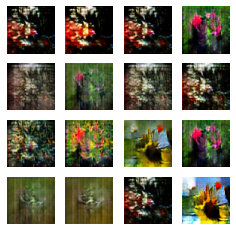

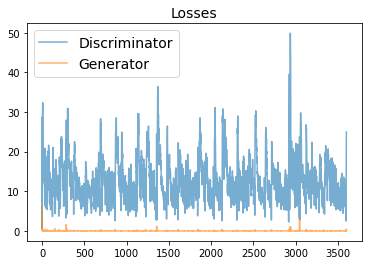

In [ ]:
train(train_dataset, EPOCHS)

Train the model a little bit more

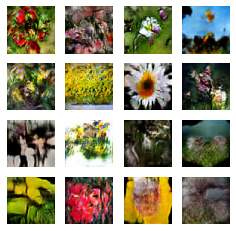

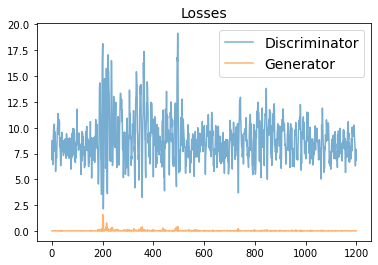

In [ ]:
train(train_dataset, 2*EPOCHS)

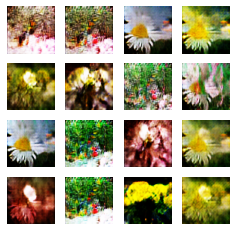

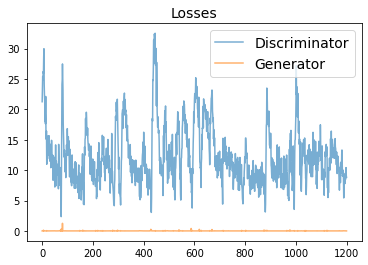

In [ ]:
train(train_dataset, 100)

In [ ]:
checkpoint.save(file_prefix = checkpoint_prefix)

'./training_checkpoints/ckpt-6'

# Restore a Checkpoint

In [23]:
RESTORE_CHECKPOINT = True
if RESTORE_CHECKPOINT:
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

Generate some images

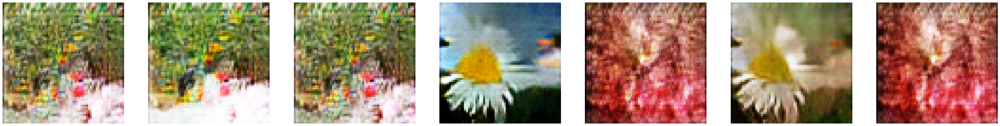

In [28]:
noise = tf.random.normal([7, NOISE_SIZE])
generated_image = generator(noise, training=False)
show_samples_(generated_image)

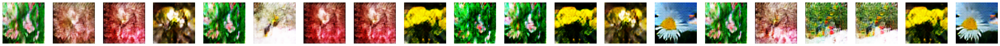

In [ ]:
noise = tf.random.normal([20, NOISE_SIZE])
generated_image = generator(noise, training=False)
show_samples_(generated_image)

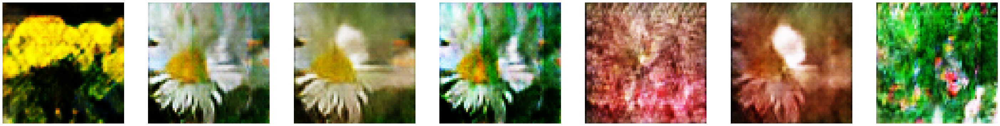

In [ ]:
noise = tf.random.normal([7, NOISE_SIZE])
generated_image = generator(noise, training=False)
show_samples_(generated_image)

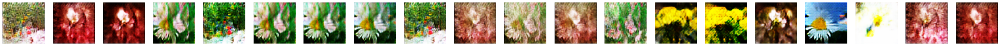

In [ ]:
noise = tf.random.normal([20, NOISE_SIZE])
generated_image = generator(noise, training=False)
show_samples_(generated_image)

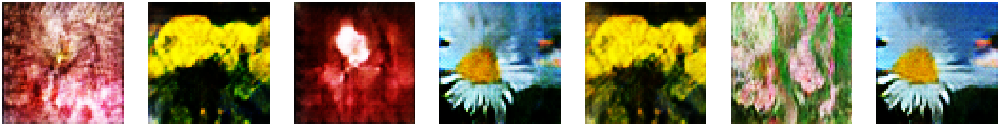

In [ ]:
noise = tf.random.normal([7, NOISE_SIZE])
generated_image = generator(noise, training=False)
show_samples_(generated_image)

# Saving Models weights

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [29]:
discriminator.save_weights('discriminator_weights.h5')

In [30]:
generator.save_weights('generator_weights.h5')

In [ ]:
!cp -r /content/training_checkpoints /content/drive/MyDrive/Checkpoints/Flower_GAN

In [ ]:
!cp -r /content/logs /content/drive/MyDrive/Logs/Logs_flowerGan

cp: cannot stat '/content/logs': No such file or directory


In [ ]:
!cp -r /content/training_checkpoints_2 /content/drive/MyDrive/Checkpoints/Flower_GAN

In [ ]:
!rm -rf /content/training_checkpoints

In [8]:
!cp -r /content/drive/MyDrive/Checkpoints/Flower_GAN/training_checkpoints /content

# Load Models by their HDF5 format

In [38]:
# from keras import backend as K 
# K.clear_session()
hparams = {
  HP_EPSILON: 0.9,
  HP_LR_G: 0.0002,
  HP_LR_D: 0.0002,
}

new_generator, new_discriminator = create_models(hparams)
generator_optimizer     = tf.keras.optimizers.Adam(
    learning_rate=hparams[HP_LR_G], beta_1=BETA1)
discriminator_optimizer = tf.keras.optimizers.Adam(
    learning_rate=hparams[HP_LR_D], beta_1=BETA1)

In [39]:
new_generator.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 1024)              102400    
                                                                 
 batch_normalization_24 (Bat  (None, 1024)             4096      
 chNormalization)                                                
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 1024)              0         
                                                                 
 reshape_3 (Reshape)         (None, 4, 4, 64)          0         
                                                                 
 conv2d_transpose_12 (Conv2D  (None, 8, 8, 256)        409600    
 Transpose)                                                      
                                                                 
 batch_normalization_25 (Bat  (None, 8, 8, 256)       

In [40]:
new_discriminator.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 32, 32, 64)        4864      
                                                                 
 batch_normalization_28 (Bat  (None, 32, 32, 64)       256       
 chNormalization)                                                
                                                                 
 leaky_re_lu_28 (LeakyReLU)  (None, 32, 32, 64)        0         
                                                                 
 conv2d_13 (Conv2D)          (None, 16, 16, 128)       204928    
                                                                 
 batch_normalization_29 (Bat  (None, 16, 16, 128)      512       
 chNormalization)                                                
                                                                 
 leaky_re_lu_29 (LeakyReLU)  (None, 16, 16, 128)      

In [41]:
new_generator.load_weights('./Weights/generator_weights.h5')

In [42]:
new_discriminator.load_weights('./Weights/discriminator_weights.h5')

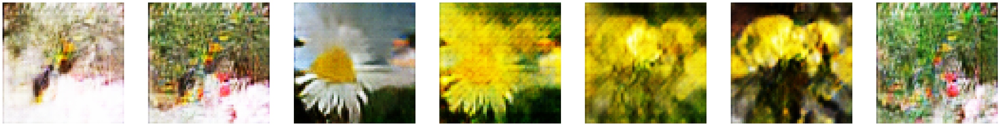

In [43]:
noise = tf.random.normal([7, NOISE_SIZE])
generated_image = new_generator(noise, training=False)
show_samples_(generated_image)